# Lab 3: Clustering

## AirBnB Listings for Los Angeles Area

### Jason McDonald, Miguel Bonilla, Zachary Bunn

**Table of Contents**
- [Business Understanding](#Business-Understanding)
- [Data Understanding 1](#Data-Understanding-1)
    - [Data Wrangling](#Data-Wrangling)
        - [Missing Values](#Missing-Values)
        - [Duplicates](#Duplicates)
        - [Outliers](#Outliers)
    - [Prepare Data](#Prepare-Data)
        - [Scaling](#Scaling)
- [Data Understanding 2](#Data-Understanding-2)
- [Modeling and Evaluation 1](#Modeling-and-Evaluation-1)
    - [Principal Components](#Principal-Components)
    - [K-Means](#K-Means)
    - [Bisecting K-Means](#Bisecting-K-Means)
    - [Mini-Batch K-Means](#Mini-Batch-K-Means)
    - [Agglomerative Clustering](#Agglomerative-Clustering)
    - [DBSCAN](#DBSCAN)
- [Modeling and Evaluation 2](#Modeling-and-Evaluation-2)
- [Modeling and Evaluation 3](#Modeling-and-Evaluation-3)
- [Modeling and Evaluation 4](#Modeling-and-Evaluation-4)
- [Deployment](#Deployment)
- [Exceptional Work](#Exceptional-Work)

In [1]:
# Import Packages
import pandas as pd
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler
import scipy
from sklearnex import patch_sklearn, unpatch_sklearn
import time
import seaborn as sns
from matplotlib import pyplot as plt

In [2]:
## define function to call figure for cluster counts
def clusterCounts(clusterPreds):
    clusterLabels = np.unique(clusterPreds)
    clusterCounts = np.unique(clusterPreds,return_counts=True)[1]
    dfPred = pd.DataFrame(clusterCounts,columns=['Count'],index = clusterLabels)
    
    fig = ff.create_table(dfPred,colorscale=[[0,'#009477'],[.5, '#d9d9d9'], [1, '#ffffff']],index=True,index_title='Cluster')
    fig.layout.width = 200
    fig.show()

In [3]:
### function for scores
def modelScores(model_scores):
    fig = ff.create_table(model_scores.set_index('Clusters').round(4),index=True,index_title='Clusters',colorscale=[[0,'#009477'],[.5, '#d9d9d9'], [1, '#ffffff']])
    fig.layout.width = 500
    fig.show()

In [4]:
### function for side-by-side plots (3)
def sidePlots(model_scores,model_title):
    fig1 = px.line(data_frame=model_scores, x = 'Clusters',y = 'Silhouette',color_discrete_sequence=px.colors.qualitative.Dark2)
    fig2 = px.line(data_frame=model_scores, x = 'Clusters',y = 'DB_index',color_discrete_sequence=px.colors.qualitative.Dark2)
    fig3 = px.line(data_frame=model_scores, x = 'Clusters',y = 'Inertia',color_discrete_sequence=px.colors.qualitative.Dark2)
    fig = make_subplots(rows=1,cols=3,subplot_titles=('Silhouette','DB Index', 'Inertia'))
    fig.add_trace(fig1.data[0],row=1,col=1)
    fig.add_trace(fig2.data[0],row=1,col=2)
    fig.add_trace(fig3.data[0],row=1,col=3)
    fig.update_layout(title_text = model_title)
    fig.show()

In [5]:
### function for side-by-side plots (2)
def sidePlots2(model_scores,model_title):
    fig1 = px.line(data_frame=model_scores,
                   x = 'Clusters',
                   y = 'Silhouette',
                   color='Metric',
                   color_discrete_sequence=px.colors.qualitative.Dark2
                  )
    fig2 = px.line(data_frame=model_scores,
                   x = 'Clusters',
                   y = 'DB_index',
                   color='Metric',
                   color_discrete_sequence=px.colors.qualitative.Dark2
                  )
    fig = make_subplots(rows=1,cols=2,subplot_titles=('Silhouette','DB Index'))
    fig.add_trace(fig1.data[0],row=1,col=1)
    fig.add_trace(fig1.data[1],row=1,col=1)
    fig.add_trace(fig2.data[0],row=1,col=2)
    fig.add_trace(fig2.data[1],row=1,col=2)
    fig.update_layout(title_text=model_title)
    fig.show()

In [6]:
### function for PC plots colored by clusters, using plotly, leaving in for now but will probably remove in the future
def pca_plots(model_preds,model_title):
    df_pca = pd.DataFrame(X_red,columns=['PC1','PC2','PC3','PC4'])
    df_pca['preds']=model_preds
    #df_pca['preds'] = df_pca['preds'].astype(str)
    fig_preds1 = px.scatter(data_frame=df_pca,x='PC1',y='PC2',color='preds')
    fig_preds2 = px.scatter(data_frame=df_pca,x='PC1',y='PC3',color='preds')
    fig_preds3 = px.scatter(data_frame=df_pca,x='PC1',y='PC4',color='preds')
    fig_preds4 = px.scatter(data_frame=df_pca,x='PC2',y='PC3',color='preds')
    fig_preds5 = px.scatter(data_frame=df_pca,x='PC2',y='PC4',color='preds')
    fig_preds6 = px.scatter(data_frame=df_pca,x='PC3',y='PC4',color='preds')

    fig_preds = make_subplots(rows=3,cols=2,subplot_titles=['PC2 vs PC1', 'PC3 vs PC1', 'PC4 vs PC1', 'PC3 vs PC2', 'PC4 vs PC2', 'PC4 vs PC3'])
    fig_preds.add_trace(fig_preds1.data[0],row=1,col=1)
    fig_preds.add_trace(fig_preds2.data[0],row=1,col=2)
    fig_preds.add_trace(fig_preds3.data[0],row=2,col=1)
    fig_preds.add_trace(fig_preds4.data[0],row=2,col=2)
    fig_preds.add_trace(fig_preds5.data[0],row=3,col=1)
    fig_preds.add_trace(fig_preds6.data[0],row=3,col=2)
    fig_preds.layout.height = 900
    fig_preds.update_layout(coloraxis_autocolorscale=False, coloraxis_colorscale=['#1B9E77','#E8D035','#D95F02'],title_text = model_title)
    fig_preds.show()

In [7]:
### function for PC plots colored by clusters using seaborn
def pca_plots(model_preds,model_title):
    df_pca = pd.DataFrame(X_red,columns=['PC1','PC2','PC3','PC4'])
    df_pca['preds'] = model_preds
    #plt.style.use('ggplot')
    sns.set_style('darkgrid')
    sns.set_palette(['#1B9E77','#D95F02','#DA3939','#EBA517','#B0b516','#DDEA25','#9DEB1C','#2DEA37','#AB1516','#15A7AB'],len(np.unique(model_preds)))
    pal1 = sns.color_palette()
    f, axes = plt.subplots(2,3,figsize = (14,8),gridspec_kw={'wspace':.25})
    f.suptitle(model_title,x=.09,y=.92,fontweight = 'roman',horizontalalignment = 'left')
    
    sns.scatterplot(data=df_pca,x='PC1',y='PC2',hue='preds',ax=axes[0,0],palette=pal1)
    sns.scatterplot(data=df_pca,x='PC1',y='PC3',hue='preds',ax=axes[0,1],palette=pal1)
    sns.scatterplot(data=df_pca,x='PC1',y='PC4',hue='preds',ax=axes[0,2],palette=pal1)
    sns.scatterplot(data=df_pca,x='PC2',y='PC3',hue='preds',ax=axes[1,0],palette=pal1)
    sns.scatterplot(data=df_pca,x='PC2',y='PC4',hue='preds',ax=axes[1,1],palette=pal1)
    sns.scatterplot(data=df_pca,x='PC3',y='PC4',hue='preds',ax=axes[1,2],palette=pal1)

### Business Understanding
(10 Points) Describe the purpose of the data set you selected (i.e., why was this data collected in the first place?). How will you measure the effectiveness of a good algorithm? Why does your chosen validation method make sense for this specific
dataset and the stakeholders needs?

### Data Understanding 1
(10 Points) Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file. Verify data quality: Are there missing values? Duplicate data? Outliers? Are those mistakes? How do you deal with these problems?

#### Data Wrangling

In [8]:
# load the data
df = pd.read_csv("Data_Files/airbnb_los_angeles.csv")

In [9]:
# Remove non-useful variables
for col in [
    'listing_url','scrape_id','last_scraped','description','neighborhood_overview','picture_url','host_url','host_about','host_response_time','host_response_rate','host_acceptance_rate',
    'host_thumbnail_url','host_picture_url','host_verifications','host_has_profile_pic','bathroom_text','host_listings_count','host_neighbourhood','bathrooms','minimum_minimum_nights',
    'maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm','maximum_nights_avg_ntm','calendar_updated','availability_30','availability_60',
    'availability_90','availability_365','calendar_last_scraped','number_of_reviews_ltm','number_of_reviews_l30d','review_scores_accuracy','review_scores_communication','review_scores_cleanliness',
    'review_scores_checkin','review_scores_value','review_scores_location','calculated_host_listings_count_entire_homes','calculated_host_listings_count_private_rooms',
    'calculated_host_listings_count_shared_rooms','reviews_per_month','neighbourhood','neighbourhood_group_cleansed', 'first_review','last_review','minimum_nights','maximum_nights','license','host_total_listings_count'
]:
    if col in df:
        del df[col]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42041 entries, 0 to 42040
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              42041 non-null  int64  
 1   name                            42039 non-null  object 
 2   host_id                         42041 non-null  int64  
 3   host_name                       41858 non-null  object 
 4   host_since                      41858 non-null  object 
 5   host_location                   41780 non-null  object 
 6   host_is_superhost               41858 non-null  object 
 7   host_identity_verified          41858 non-null  object 
 8   neighbourhood_cleansed          42041 non-null  object 
 9   latitude                        42041 non-null  float64
 10  longitude                       42041 non-null  float64
 11  property_type                   42041 non-null  object 
 12  room_type                       

##### Missing Values
After removing unusable varialbes, we are left with 24 variables (14 categorical, 10 numerical).
10 variables have missing values (name, host_name, host_since, host_location, host_is_superhost, host_identity_verified, bathrooms_text, bedrooms, beds, and review_scores_rating)

In [10]:
# remove nulls
df = df[~df.review_scores_rating.isnull() & ~df.bathrooms_text.isnull() & ~df.host_since.isnull() & ~df.host_location.isnull()]
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32329 entries, 0 to 42000
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              32329 non-null  int64  
 1   name                            32329 non-null  object 
 2   host_id                         32329 non-null  int64  
 3   host_name                       32329 non-null  object 
 4   host_since                      32329 non-null  object 
 5   host_location                   32329 non-null  object 
 6   host_is_superhost               32329 non-null  object 
 7   host_identity_verified          32329 non-null  object 
 8   neighbourhood_cleansed          32329 non-null  object 
 9   latitude                        32329 non-null  float64
 10  longitude                       32329 non-null  float64
 11  property_type                   32329 non-null  object 
 12  room_type                       

In [11]:
## Creating categorical variable property type from string
types = ['Private room', 'Entire', 'Room in hotel','Room','Shared room']
pat = '|'.join(r"\b{}\b".format(x) for x in types)

df['property_type']= df['property_type'].str.extract('('+ pat + ')', expand = False)
df['property_type'] = (df.property_type.
                       fillna(value = 'other').
                       replace(['Entire','Room in hotel'],['Entire unit','Hotel room']))
df['property_type'].value_counts()

Entire unit     22767
Private room     8081
Shared room       510
Room              401
other             298
Hotel room        272
Name: property_type, dtype: int64

In [12]:
# impute values based on median
df['beds'] = df[['accommodates','beds']].groupby(by = 'accommodates').transform(lambda grp: grp.fillna(grp.median()))
df_imputed = df[['bedrooms','beds','property_type']].groupby(by=['property_type','beds']).transform(lambda grp: grp.fillna(grp.median()))

index = df_imputed[df_imputed.bedrooms.isnull()].index
df = df.drop(index= index)

df['imputed']=df_imputed[['bedrooms']]

# replace 'bedrooms' column with imputed column and deleting the duplicated column
df['bedrooms'] = df['imputed']
del df['imputed']
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32327 entries, 0 to 42000
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              32327 non-null  int64  
 1   name                            32327 non-null  object 
 2   host_id                         32327 non-null  int64  
 3   host_name                       32327 non-null  object 
 4   host_since                      32327 non-null  object 
 5   host_location                   32327 non-null  object 
 6   host_is_superhost               32327 non-null  object 
 7   host_identity_verified          32327 non-null  object 
 8   neighbourhood_cleansed          32327 non-null  object 
 9   latitude                        32327 non-null  float64
 10  longitude                       32327 non-null  float64
 11  property_type                   32327 non-null  object 
 12  room_type                       

/home/migue/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


We can see that all missing values have been properly dealth with. After imputation, there are no missing values left in the dataset.

In [13]:
## fixing variable types
df['host_since'] = pd.to_datetime(df.host_since)
df['price'] = df['price'].replace('[\$,]','',regex = True).astype(float)
df['bathrooms_text'] = df['bathrooms_text'].replace(['Half-bath', 'Shared half-bath', 'Private half-bath'],['0.5 bath','0.5 shared bath', '0.5 private bath'])
df_bathrooms = df['bathrooms_text'].str.split(n=1, expand=True).rename(columns = {0:'bathroom_number',1:'bathroom_type'})
df_bathrooms['bathroom_type'] = df_bathrooms.bathroom_type.fillna(value = 'bath')
df_bathrooms['bathroom_type'] = df_bathrooms['bathroom_type'].replace(['baths','shared baths'],['bath','shared bath'])
df_bathrooms['bathroom_number'] = df_bathrooms['bathroom_number'].astype('float')
df.insert(15, 'bathroom_number',df_bathrooms['bathroom_number'])
df.insert(16, 'bathroom_type', df_bathrooms['bathroom_type'])
del df['bathrooms_text']

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32327 entries, 0 to 42000
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              32327 non-null  int64         
 1   name                            32327 non-null  object        
 2   host_id                         32327 non-null  int64         
 3   host_name                       32327 non-null  object        
 4   host_since                      32327 non-null  datetime64[ns]
 5   host_location                   32327 non-null  object        
 6   host_is_superhost               32327 non-null  object        
 7   host_identity_verified          32327 non-null  object        
 8   neighbourhood_cleansed          32327 non-null  object        
 9   latitude                        32327 non-null  float64       
 10  longitude                       32327 non-null  float64       
 11  pr

##### Duplicates

In [15]:
df.nunique()

id                                32327
name                              31649
host_id                           17749
host_name                          6802
host_since                         4132
host_location                      1011
host_is_superhost                     2
host_identity_verified                2
neighbourhood_cleansed              303
latitude                          23511
longitude                         25476
property_type                         6
room_type                             4
accommodates                         16
bathroom_number                      25
bathroom_type                         3
bedrooms                             13
beds                                 23
amenities                         30619
price                              1424
has_availability                      2
number_of_reviews                   577
review_scores_rating                167
instant_bookable                      2
calculated_host_listings_count       73


The unique indentifier 'id' shows no duplicates. Therefore we can assume no two listings are the same. Since each individual listing is unique.

##### Outliers

In [16]:
df.iloc[:,[13,14,16,17,19,21,22,24]].describe().T

,count,mean,std,min,25%,50%,75%,max
accommodates,32327.0,4.043926,2.832425,1.0,2.00,3.00,6.0,16.0
bathroom_number,32327.0,1.547963,0.994749,0.0,1.00,1.00,2.0,12.0
bedrooms,32327.0,1.746791,1.116748,1.0,1.00,1.00,2.0,17.0
beds,32327.0,2.264083,1.738420,1.0,1.00,2.00,3.0,30.0
price,32327.0,256.995824,458.488392,10.0,89.00,149.00,275.0,15636.0
number_of_reviews,32327.0,46.673493,79.700341,1.0,4.00,15.00,53.0,1512.0
review_scores_rating,32327.0,4.699717,0.617229,0.0,4.67,4.88,5.0,5.0
calculated_host_listings_count,32327.0,13.376744,44.445160,1.0,1.00,2.00,7.0,532.0


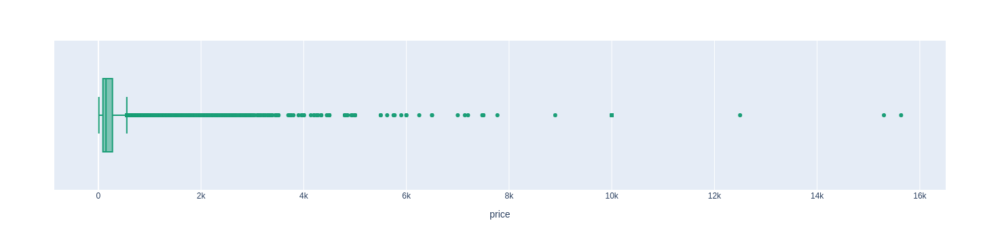

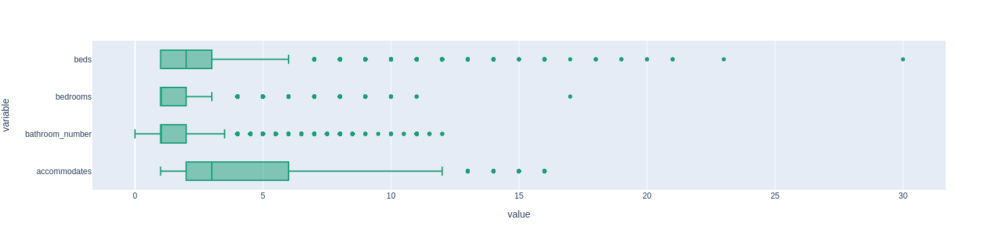

In [17]:
fig1 = px.box(df, x='price',color_discrete_sequence=px.colors.qualitative.Dark2)
fig2 = px.box(df, x= ['accommodates','bathroom_number', 'bedrooms','beds'], color_discrete_sequence=px.colors.qualitative.Dark2)
fig1.show()
fig2.show()

We can clearly see that price has extreme outliers, with the 75% percentile at \\$275, and listing prices at up to \\$1500. Therefore, it was decided to filter out listings with prices of \\$750 and above, to maintain some insight into luxury listings. This also handles some of the most extreme outliers for bedrooms and bathroom_number.

In [18]:
### filter out price outliers
df = df[(df.beds<10) & (df.price<750)]
df = df.reset_index(drop=True)

In [19]:
# breakdown of categorical variables with number of levels (unique)
df.iloc[:,[1,3,5,6,7,8,11,12,15,18,20,23]].describe().T

,count,unique,top,freq
name,30580,29942,Boutique Hostel,46
host_name,30580,6604,David,249
host_location,30580,980,"Los Angeles, California, United States",10613
host_is_superhost,30580,2,f,20236
host_identity_verified,30580,2,t,26080
neighbourhood_cleansed,30580,302,Long Beach,1163
property_type,30580,6,Entire unit,21090
room_type,30580,4,Entire home/apt,21433
bathroom_type,30580,3,bath,22738
amenities,30580,28937,"[""Hangers"", ""First aid kit"", ""Heating"", ""Fire ...",40


#### Prepare Data

In [20]:
## new feature host_for, a numerical variable that corresponds to length in months since becoming host
## data is from June 6 2022, 06-06-2022
end_date = pd.to_datetime('06-06-2022', format= "%m-%d-%Y")
df['host_for'] = (end_date-df.host_since)/np.timedelta64(1,'M')

df = df.drop(columns= ['host_location', 'host_since']) #drop old host_location and host_since columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30580 entries, 0 to 30579
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              30580 non-null  int64  
 1   name                            30580 non-null  object 
 2   host_id                         30580 non-null  int64  
 3   host_name                       30580 non-null  object 
 4   host_is_superhost               30580 non-null  object 
 5   host_identity_verified          30580 non-null  object 
 6   neighbourhood_cleansed          30580 non-null  object 
 7   latitude                        30580 non-null  float64
 8   longitude                       30580 non-null  float64
 9   property_type                   30580 non-null  object 
 10  room_type                       30580 non-null  object 
 11  accommodates                    30580 non-null  int64  
 12  bathroom_number                 

##### Scaling

In [21]:
y_reg = df.loc[:,df.columns == 'price'] ### saving original price prior to scaling for regression modeling 
num_columns = ['accommodates','bathroom_number','bedrooms','beds','price','number_of_reviews','review_scores_rating','calculated_host_listings_count','host_for']
scaled = df[num_columns]
scaled = pd.DataFrame(StandardScaler().fit_transform(scaled),columns=scaled.columns)

df_num = scaled[num_columns]

In [22]:
### clean up temporary files
del scaled
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30580 entries, 0 to 30579
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              30580 non-null  int64  
 1   name                            30580 non-null  object 
 2   host_id                         30580 non-null  int64  
 3   host_name                       30580 non-null  object 
 4   host_is_superhost               30580 non-null  object 
 5   host_identity_verified          30580 non-null  object 
 6   neighbourhood_cleansed          30580 non-null  object 
 7   latitude                        30580 non-null  float64
 8   longitude                       30580 non-null  float64
 9   property_type                   30580 non-null  object 
 10  room_type                       30580 non-null  object 
 11  accommodates                    30580 non-null  int64  
 12  bathroom_number                 

In [23]:
df_num.describe()

,accommodates,bathroom_number,bedrooms,beds,price,number_of_reviews,review_scores_rating,calculated_host_listings_count,host_for
count,3.058000e+04,3.058000e+04,3.058000e+04,3.058000e+04,3.058000e+04,3.058000e+04,3.058000e+04,3.058000e+04,3.058000e+04
mean,-8.922446e-17,-5.204760e-17,4.461223e-17,2.974149e-17,2.974149e-17,-1.115306e-17,-7.435372e-18,2.230612e-17,-1.487074e-17
std,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00
min,-1.107019e+00,-1.783036e+00,-6.610494e-01,-7.509706e-01,-1.243972e+00,-5.770197e-01,-7.623051e+00,-2.716875e-01,-2.069410e+00
25%,-7.045577e-01,-5.371434e-01,-6.610494e-01,-7.509706e-01,-7.143722e-01,-5.400700e-01,-4.401467e-02,-2.716875e-01,-7.273150e-01
50%,-3.020962e-01,-5.371434e-01,-6.610494e-01,-5.794827e-02,-3.259995e-01,-4.045877e-01,2.805693e-01,-2.495258e-01,6.657625e-02
75%,5.028269e-01,7.087490e-01,4.115008e-01,6.350741e-01,4.154395e-01,8.807517e-02,4.915489e-01,-1.387172e-01,7.201097e-01
max,4.929904e+00,1.254473e+01,6.846802e+00,4.793208e+00,3.974347e+00,1.803332e+01,4.915489e-01,1.149618e+01,2.918804e+00


In [24]:
X_mat = df_num.to_numpy()

### Data Understanding 2
(10 Points) Visualize the any important attributes appropriately. Important: Provide an interpretation for any charts or graphs.

In [25]:
def plotCategoricalFeatures(feature1, feature1Label, feature2, feature2Label, feature3, feature3Label, titleText):
    
    fig=go.Figure()
    fig = (px.histogram(
            x=feature1,
            color=feature2,
            pattern_shape=feature3,
            color_discrete_sequence=['#00A699', '#a9a9a9', '#009477'],
            barmode="relative",
            text_auto=True,
            hover_data=[feature2, feature3]
        )
        .update_traces(
            hovertemplate = '<b>'+ feature1Label + ': </b>%{x}<br><b>Count:</b>%{y}'
            #hovertemplate = '<b>'+ feature1Label + ': </b>%{x}<b><br>' + feature2Label + ': </b>%{hoverdata[0]}<b><br>' + feature3Label + ': </b>%{customdata[1]}<br><b>Count:</b>%{y}'
        )
        .update_layout(
            title={
                "text":'<b>' + titleText + '</b>', 
                "x":0.5,},
            yaxis_title="Count",
            legend_title_text=feature2Label + ", " + feature3Label
        )
        .update_xaxes(
            categoryorder="category ascending"
        )
    )
    #print(fig)
    return fig

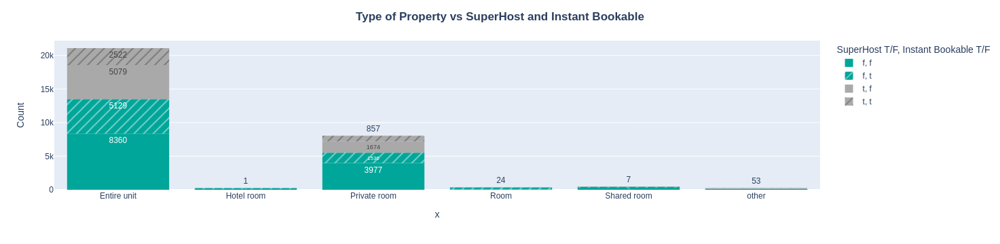

In [26]:
plotCategoricalFeatures(df['property_type'], "Property Type", df['host_is_superhost'], "SuperHost T/F", df['instant_bookable'], "Instant Bookable T/F", "Type of Property vs SuperHost and Instant Bookable").show()

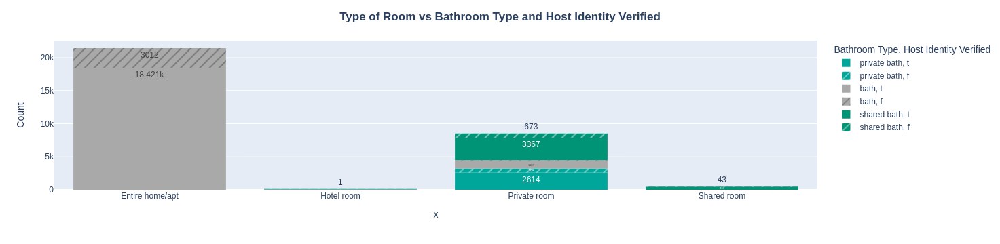

In [27]:
plotCategoricalFeatures(df['room_type'], "Room Type", df['bathroom_type'], "Bathroom Type", df['host_identity_verified'], "Host Identity Verified", "Type of Room vs Bathroom Type and Host Identity Verified").show()

### Modeling and Evaluation 1
(10 Points) Train and adjust parameters

#### Principal Components

In [28]:
from sklearn.decomposition import PCA

pca = PCA(n_components=8)
pca.fit(X_mat)

PCA(n_components=8)

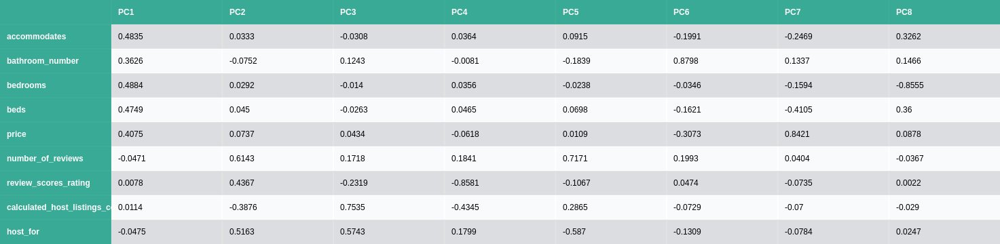

In [29]:
indx = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8']
pComp = pd.DataFrame(pca.components_,columns=df_num.columns, index = indx).T
pCompFig = ff.create_table(pComp.round(4),colorscale=[[0,'#009477'],[.5, '#d9d9d9'], [1, '#ffffff']], index=True)
pCompFig.layout.width = 1110
pCompFig.show()

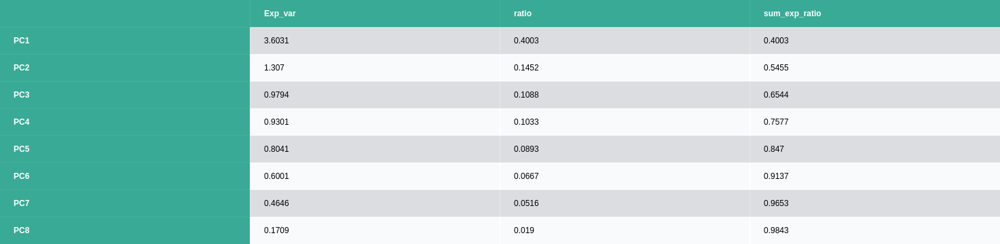

In [30]:
pVar = pd.DataFrame(data={'Exp_var':pca.explained_variance_,
                          'ratio':pca.explained_variance_ratio_,
                          'sum_exp_ratio':pca.explained_variance_ratio_.cumsum()},
                    index=indx)
pVarFig = ff.create_table(pVar.round(4),colorscale=[[0,'#009477'],[.5, '#d9d9d9'], [1, '#ffffff']],index=True)
pVarFig.layout.width = 400
pVarFig.show()

In [31]:
## get 4 components which account for 75% of variation
pca = PCA(n_components=4).fit(X_mat)
X_red = pca.transform(X_mat)

#### K-Means

In [32]:
%%time
patch_sklearn()
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
r_state = 1127

clusters = 10
kmeans_scores = []
for k in range(2,clusters+1,1):
    kmeans = KMeans(n_clusters=k,random_state=1127)
    kmeans.fit(X_mat)
    preds = kmeans.predict(X_mat)
    kmeans_scores.append({'Clusters':k,
                  'Inertia':kmeans.inertia_,
                  'Silhouette':silhouette_score(X_mat,preds),
                  'DB_index':davies_bouldin_score(X_mat,preds)})
kmeans_scores = pd.DataFrame(kmeans_scores)

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


CPU times: user 3min 30s, sys: 9min 42s, total: 13min 13s
Wall time: 2min 11s


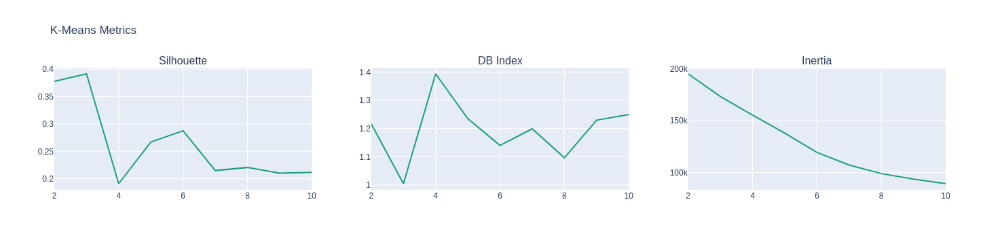

In [33]:
sidePlots(kmeans_scores,'K-Means Metrics')

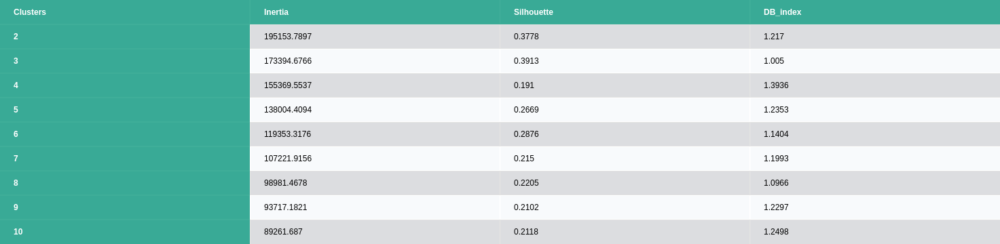

In [34]:
modelScores(kmeans_scores)

In [35]:
%%time
start = time.time()
kmeans = KMeans(n_clusters=3,random_state=r_state)
kmeans.fit(X_mat)
kmeans_preds = kmeans.predict(X_mat)
stop = time.time()
kmeansTime = stop-start

CPU times: user 288 ms, sys: 16.2 ms, total: 304 ms
Wall time: 55.1 ms


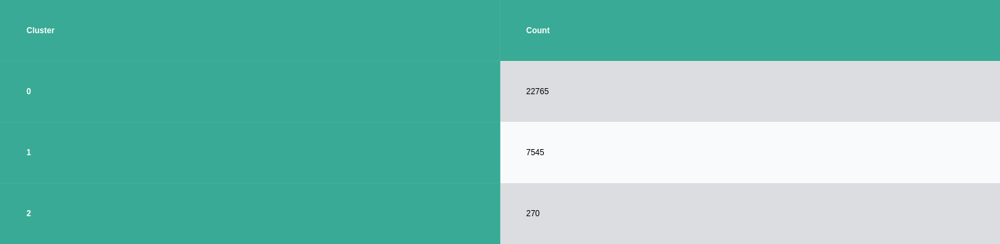

In [36]:
clusterCounts(kmeans_preds)

In [37]:
scores = [{'Model':'KMeans',
           'Clusters':3,'Silhouette':silhouette_score(X_mat,kmeans_preds),
           'DB_index':davies_bouldin_score(X_mat,kmeans_preds),
           'Time':kmeansTime
          }]

In [38]:
%%time
### with PCA using 4 PCs

clusters = 10
kmeans_pca_scores = []
for k in range(2,clusters+1,1):
    kmeans = KMeans(n_clusters=k, random_state=r_state)
    kmeans.fit(X_red)
    preds = kmeans.predict(X_red)
    kmeans_pca_scores.append({'Clusters':k,
                  'Inertia':kmeans.inertia_,
                  'Silhouette':silhouette_score(X_red,preds),
                  'DB_index':davies_bouldin_score(X_mat,preds)})
kmeans_pca_scores = pd.DataFrame(kmeans_pca_scores) 
unpatch_sklearn()

CPU times: user 3min 29s, sys: 10min 15s, total: 13min 45s
Wall time: 2min 9s


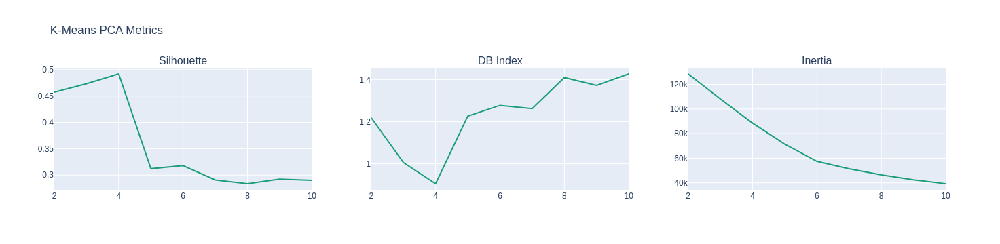

In [39]:
sidePlots(kmeans_pca_scores,'K-Means PCA Metrics')

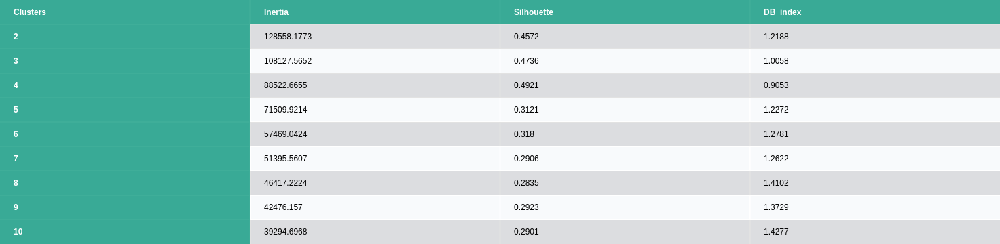

In [40]:
modelScores(kmeans_pca_scores)

In [41]:
%%time
start = time.time()
kmeans_pca = KMeans(n_clusters=4,random_state=r_state)
kmeans_pca.fit(X_red)
kmeans_pca_preds = kmeans_pca.predict(X_red)
stop = time.time()
kmeans_pcaTime = stop - start

CPU times: user 207 ms, sys: 3.73 ms, total: 210 ms
Wall time: 38.8 ms


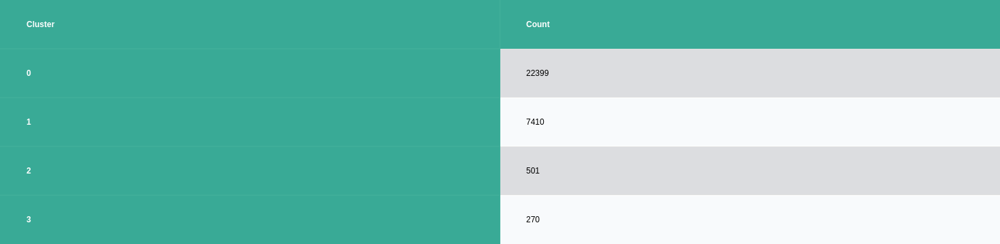

In [42]:
clusterCounts(kmeans_pca_preds)

In [43]:
scores.append({'Model':'KMeans w PCA',
               'Clusters':4,'Silhouette':silhouette_score(X_red,kmeans_pca_preds),
               'DB_index':davies_bouldin_score(X_red,kmeans_pca_preds),
               'Time':kmeans_pcaTime
              })

#### Bisecting K-Means

In [44]:
%%time
from sklearn.cluster import BisectingKMeans

bisect_scores = []
for k in range(2,clusters+1):
    bisect_means = BisectingKMeans(n_clusters = k, random_state = r_state)
    bisect_means.fit(X_mat)
    preds = bisect_means.predict(X_mat)
    bisect_scores.append({'Clusters':k,
                  'Inertia':bisect_means.inertia_,
                  'Silhouette':silhouette_score(X_mat,preds),
                  'DB_index':davies_bouldin_score(X_mat,preds)})
bisect_scores = pd.DataFrame(bisect_scores)

CPU times: user 3min 36s, sys: 10min 35s, total: 14min 12s
Wall time: 2min 6s


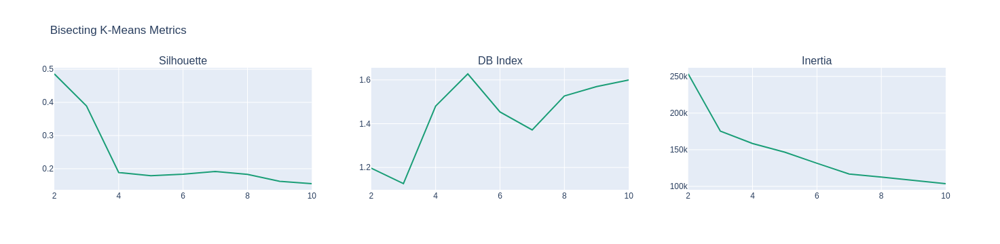

In [45]:
sidePlots(bisect_scores,'Bisecting K-Means Metrics')

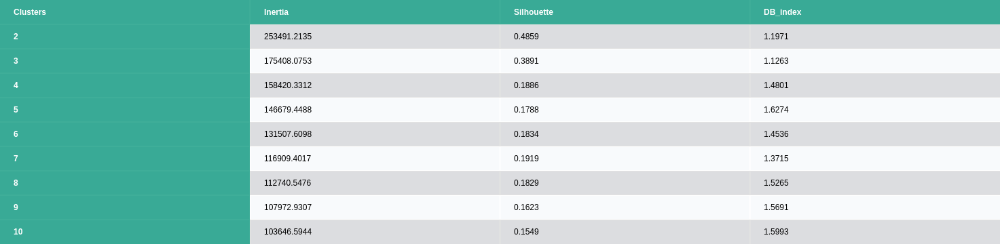

In [46]:
modelScores(bisect_scores)

In [47]:
%%time
start = time.time()
bisect_kmeans = BisectingKMeans(n_clusters=3,random_state=r_state)
bisect_kmeans.fit(X_mat)
bisect_preds = bisect_kmeans.predict(X_mat)
stop = time.time()
bisectTime = stop - start

CPU times: user 4.71 s, sys: 128 ms, total: 4.83 s
Wall time: 460 ms


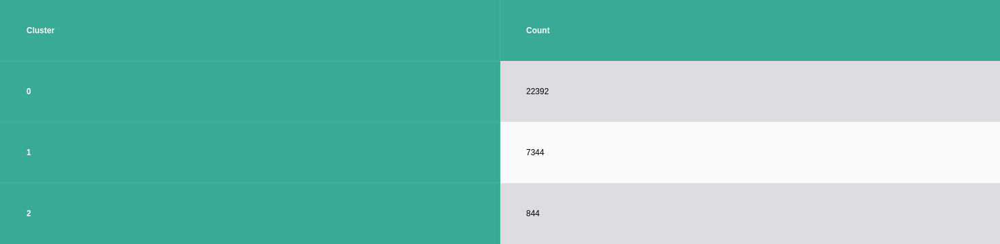

In [48]:
clusterCounts(bisect_preds)

In [49]:
%%time

bisect_pca_scores = []
for k in range(2,clusters+1):
    bisect_pca_means = BisectingKMeans(n_clusters = k, random_state = r_state)
    bisect_pca_means.fit(X_red)
    preds = bisect_pca_means.predict(X_red)
    bisect_pca_scores.append({'Clusters':k,
                  'Inertia':bisect_pca_means.inertia_,
                  'Silhouette':silhouette_score(X_red,preds),
                  'DB_index':davies_bouldin_score(X_red,preds)})
bisect_pca_scores = pd.DataFrame(bisect_pca_scores)

CPU times: user 3min 46s, sys: 10min 50s, total: 14min 36s
Wall time: 2min 4s


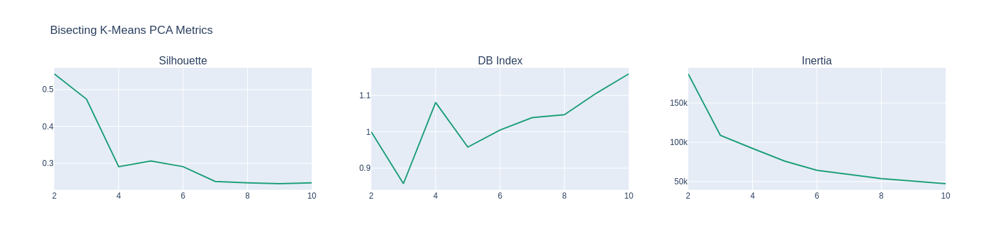

In [50]:
sidePlots(bisect_pca_scores,'Bisecting K-Means PCA Metrics')

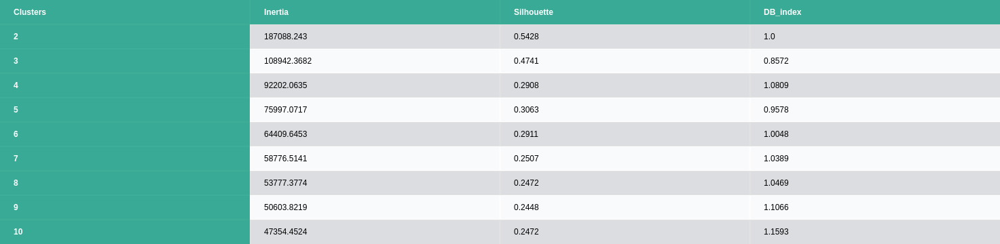

In [51]:
modelScores(bisect_pca_scores)

In [52]:
%%time
start = time.time()
bisect_pca_kmeans = BisectingKMeans(n_clusters=3,random_state=r_state)
bisect_pca_kmeans.fit(X_red)
bisect_pca_preds = bisect_pca_kmeans.predict(X_red)
stop = time.time()
bisect_pcaTime = stop - start

CPU times: user 4.77 s, sys: 139 ms, total: 4.91 s
Wall time: 470 ms


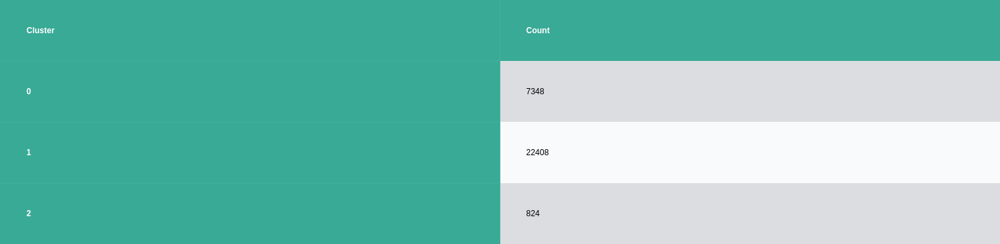

In [53]:
clusterCounts(bisect_pca_preds)

In [54]:
scores.append({'Model':'Bisecting_KMeans',
               'Clusters':3,'Silhouette':silhouette_score(X_mat,bisect_preds),
               'DB_index':davies_bouldin_score(X_mat,bisect_preds),
               'Time':bisectTime
              })
scores.append({'Model':'Bisecting_KMeans w PCA',
               'Clusters':3,'Silhouette':silhouette_score(X_red,bisect_pca_preds),
               'DB_index':davies_bouldin_score(X_red,bisect_pca_preds),
               'Time':bisect_pcaTime
              })

#### Mini-Batch K-Means

In [55]:
%%time
from sklearn.cluster import MiniBatchKMeans

mbatch_scores = []
for k in range(2,clusters+1,1):
    mbatch = MiniBatchKMeans(n_clusters=k,random_state=r_state)
    mbatch.fit(X_mat)
    mbatch_preds = mbatch.predict(X_mat)
    mbatch_scores.append({'Clusters':k,
                  'Inertia':mbatch.inertia_,
                  'Silhouette':silhouette_score(X_mat,mbatch_preds),
                  'DB_index':davies_bouldin_score(X_mat,mbatch_preds)})
mbatch_scores = pd.DataFrame(mbatch_scores)

CPU times: user 4min 20s, sys: 10min 52s, total: 15min 12s
Wall time: 2min 7s


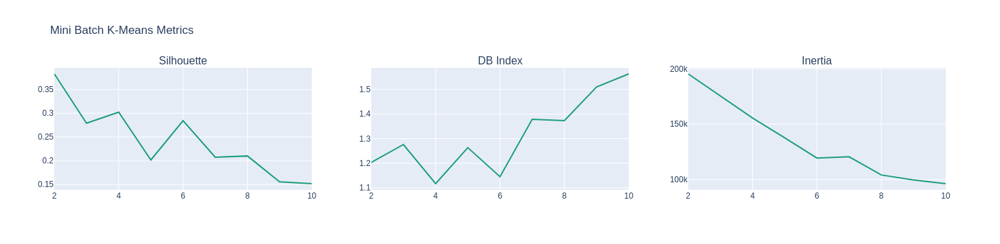

In [56]:
sidePlots(mbatch_scores,'Mini Batch K-Means Metrics')

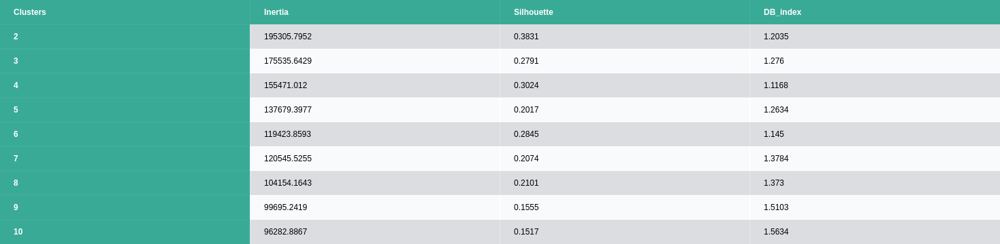

In [57]:
modelScores(mbatch_scores)

In [58]:
%%time
start = time.time()
mbatch = MiniBatchKMeans(n_clusters=4,random_state=r_state)
mbatch.fit(X_mat)
mbatch_preds = mbatch.predict(X_mat)
stop = time.time()
mbatchTime = stop - start

CPU times: user 7.45 s, sys: 1.21 s, total: 8.66 s
Wall time: 844 ms


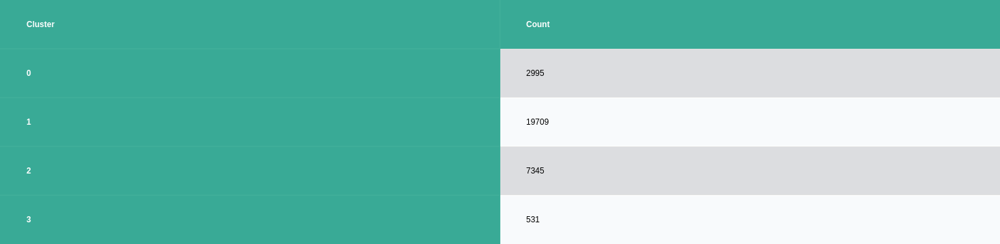

In [59]:
clusterCounts(mbatch_preds)

In [60]:
%%time

mbatch_pca_scores = []
for k in range(2,clusters+1,1):
    mbatch = MiniBatchKMeans(n_clusters=k,random_state=r_state)
    mbatch.fit(X_red)
    mbatch_preds = mbatch.predict(X_red)
    mbatch_pca_scores.append({'Clusters':k,
                  'Inertia':mbatch.inertia_,
                  'Silhouette':silhouette_score(X_red,mbatch_preds),
                  'DB_index':davies_bouldin_score(X_red,mbatch_preds)})
mbatch_pca_scores = pd.DataFrame(mbatch_pca_scores)

CPU times: user 3min 55s, sys: 12min 11s, total: 16min 7s
Wall time: 2min 2s


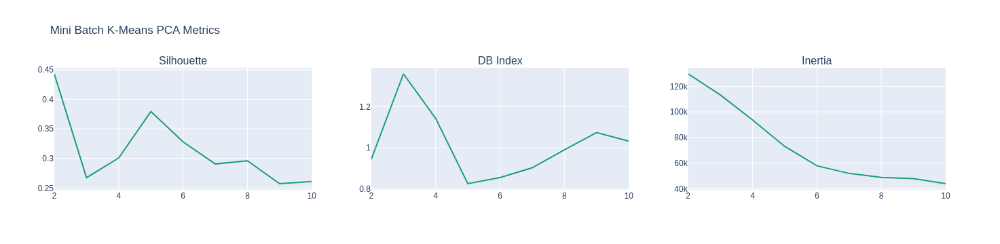

In [61]:
sidePlots(mbatch_pca_scores,'Mini Batch K-Means PCA Metrics')

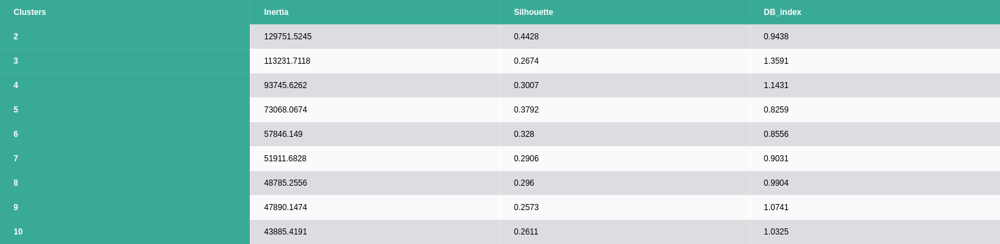

In [62]:
modelScores(mbatch_pca_scores)

In [63]:
%%time
start = time.time()
mbatch_pca = MiniBatchKMeans(n_clusters=5,random_state=r_state)
mbatch_pca.fit(X_red)
mbatch_pca_preds=mbatch_pca.predict(X_red)
stop = time.time()
mbatch_pcaTime = stop - start

CPU times: user 7.72 s, sys: 1.25 s, total: 8.97 s
Wall time: 867 ms


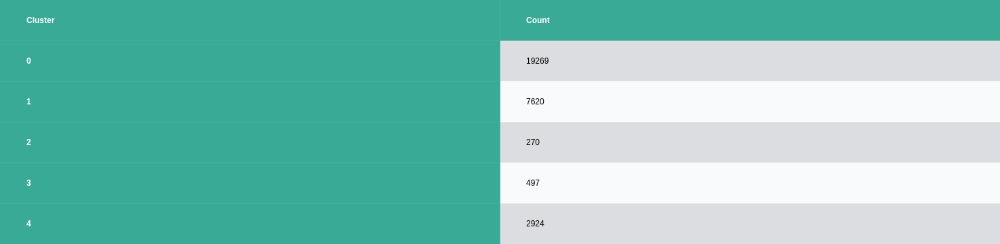

In [64]:
clusterCounts(mbatch_pca_preds)

In [65]:
scores.append({'Model':'Mini_Batch_KMeans',
               'Clusters':4,
               'Silhouette':silhouette_score(X_mat,mbatch_preds),
               'DB_index':davies_bouldin_score(X_mat,mbatch_preds),
               'Time':mbatchTime
              })
scores.append({'Model':'Mini_Batch_KMeans w PCA',
               'Clusters':5,
               'Silhouette':silhouette_score(X_red,mbatch_pca_preds),
               'DB_index':davies_bouldin_score(X_red,mbatch_pca_preds),
               'Time':mbatch_pcaTime
              })

#### Agglomerative Clustering

In [66]:
%%time
### we can't run with our number of rows
from sklearn.cluster import AgglomerativeClustering

agglo_scores = []
metr = ['manhattan','euclidean']
for i in range(2,clusters+1):
    for k in metr:
        clustering = AgglomerativeClustering(n_clusters=i,affinity=k,linkage='complete').fit(X_mat)
        preds = clustering.labels_
        agglo_scores.append({'Metric':k, 
                      'Clusters':i,
                      'Silhouette':silhouette_score(X_mat,preds),
                      'DB_index':davies_bouldin_score(X_mat,preds)})
agglo_scores = pd.DataFrame(agglo_scores)

CPU times: user 15min 26s, sys: 25min 11s, total: 40min 38s
Wall time: 13min 3s


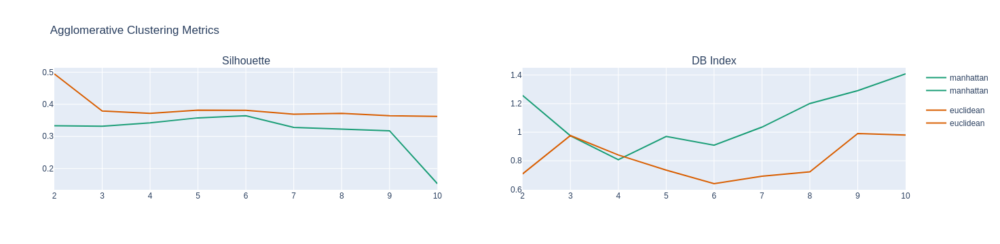

In [67]:
sidePlots2(agglo_scores,'Agglomerative Clustering Metrics')

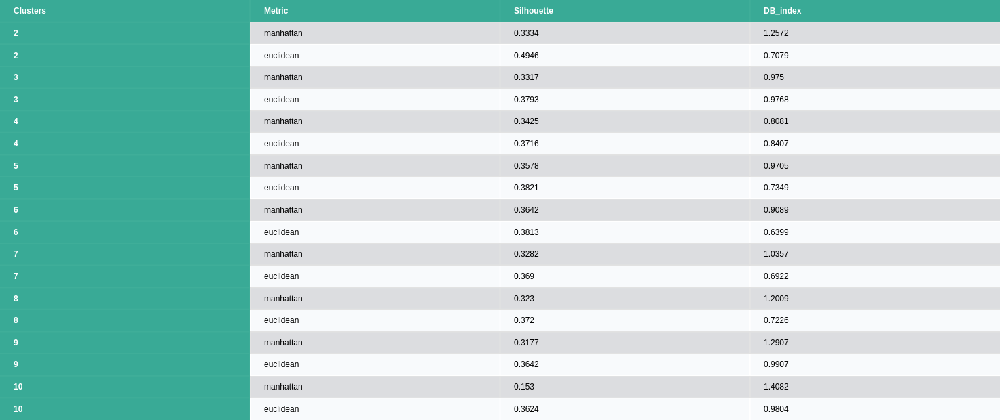

In [68]:
modelScores(agglo_scores)

In [69]:
%%time
start = time.time()
agglo_preds = AgglomerativeClustering(n_clusters=6,affinity='euclidean',linkage='complete').fit_predict(X_mat)
stop = time.time()
aggloTime = stop - start

CPU times: user 27.2 s, sys: 1.9 s, total: 29.1 s
Wall time: 29 s


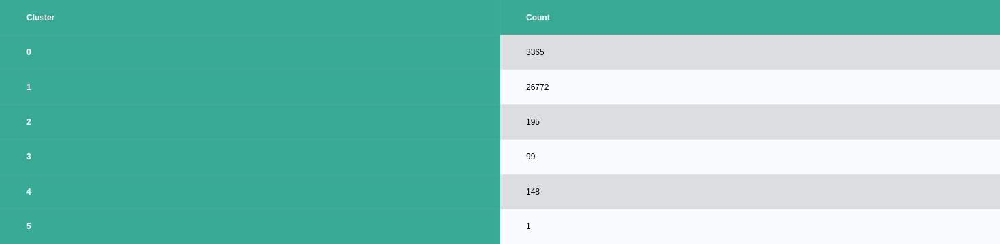

In [70]:
clusterCounts(agglo_preds)

In [71]:
%%time

agglo_pca_scores = []
clusters=10
metr = ['manhattan','euclidean']
for i in range(2,clusters+1):
    for k in metr:
        clustering = AgglomerativeClustering(n_clusters=i,affinity=k,linkage='complete').fit(X_red)
        preds = clustering.labels_
        agglo_pca_scores.append({'Metric':k, 
                      'Clusters':i,
                      'Silhouette':silhouette_score(X_red,preds),
                      'DB_index':davies_bouldin_score(X_red,preds)})
agglo_pca_scores = pd.DataFrame(agglo_pca_scores)

CPU times: user 15min 5s, sys: 25min 24s, total: 40min 29s
Wall time: 12min 37s


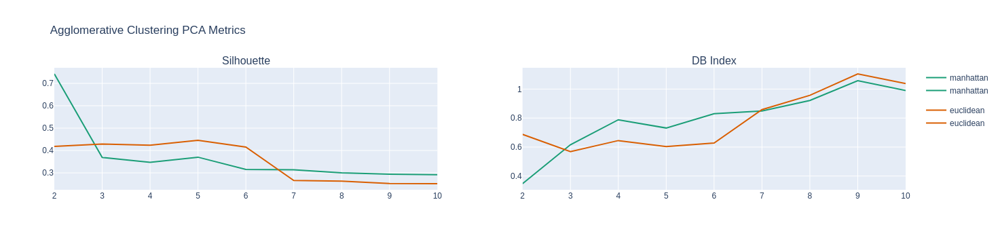

In [72]:
sidePlots2(agglo_pca_scores,'Agglomerative Clustering PCA Metrics')

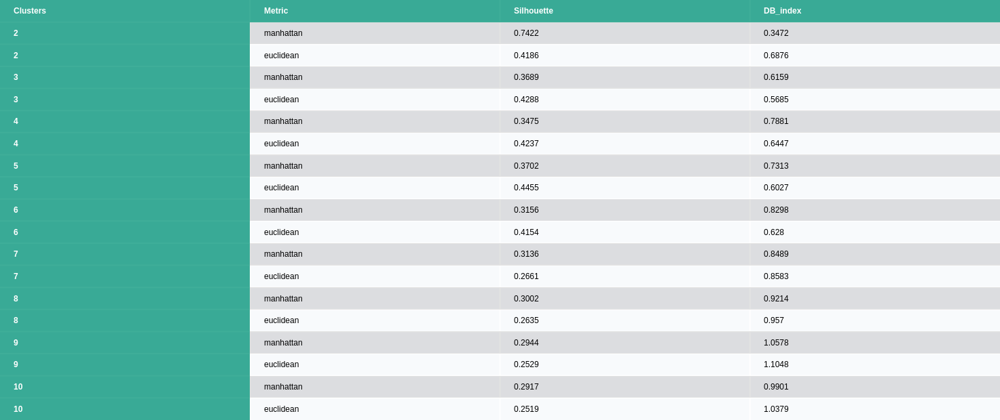

In [73]:
modelScores(agglo_pca_scores)

In [74]:
%%time
start = time.time()
agglo_pca_preds = AgglomerativeClustering(n_clusters=2,affinity='manhattan',linkage='complete').fit_predict(X_red)
stop = time.time()
agglo_pcaTime = stop - start

CPU times: user 26.7 s, sys: 1.85 s, total: 28.6 s
Wall time: 28.5 s


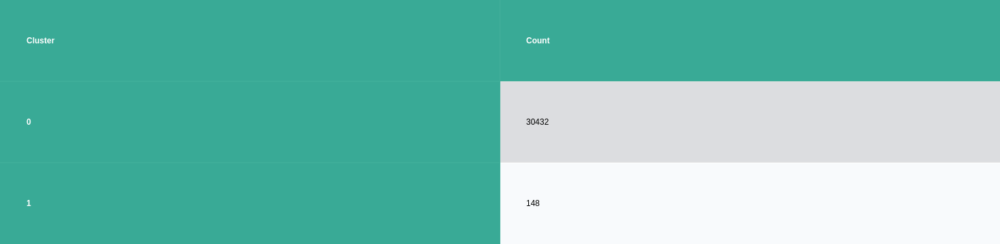

In [75]:
clusterCounts(agglo_pca_preds)

In [76]:
scores.append({'Model':'Agglomerative_Clustering',
               'Clusters':6,
               'Silhouette':silhouette_score(X_mat,agglo_preds),
               'DB_index':davies_bouldin_score(X_mat,agglo_preds),
               'Time':aggloTime
              })
scores.append({'Model':'Agglomerative_Clustering w PCA',
               'Clusters':6,
               'Silhouette':silhouette_score(X_red,agglo_pca_preds),
               'DB_index':davies_bouldin_score(X_red,agglo_pca_preds),
               'Time':agglo_pcaTime
              })

#### DBSCAN

In [77]:
## distance
#### finding ideal values for eps and min
from sklearn.neighbors import kneighbors_graph
### number of neighbors
N_neigh = 15
dmat = pd.DataFrame()

for i in range(5,N_neigh+1,2):
    knn_graph = kneighbors_graph(X_mat,i,mode='distance')
    distances = np.zeros((knn_graph.shape[0],1))
    for j in range(knn_graph.shape[0]):
        distances[j] = knn_graph[j,:].max()
    distances = np.sort(distances,axis=0)
    dmat = dmat.append(pd.DataFrame({'N':i,'x':range(X_mat.shape[0]),'y':distances.reshape(30580)}))

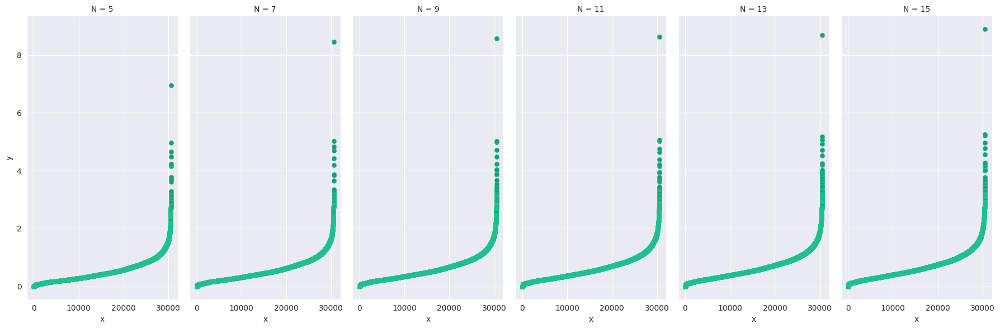

In [78]:
kwargs = {'edgecolor':'#22C795'}
sns.set_style('darkgrid')
fig_dbscan = sns.FacetGrid(dmat,col="N",height=6,aspect=.5)
fig_dbscan.map_dataframe(sns.scatterplot,x='x',y='y',color='#1B9E77',**kwargs)

In [79]:
%%time
patch_sklearn()
from sklearn.cluster import DBSCAN

dbscan_scores = []
epsi = [1.15,1.25,1.35,1.4,1.45,1.47]
mins = [5,7,9,11,13,15]
metr = ['euclidean']
for i, (epsi,mins) in enumerate(zip(epsi,mins)):
    for j in metr:
        dbscan = DBSCAN(n_jobs=-1,eps=epsi,metric=j,min_samples=mins)
        labels = dbscan.fit_predict(X_mat)
        dbscan_scores.append({'epsilon':epsi, 
                              'min samples':mins,
                              'Metric':j,
                              'Silhouette':silhouette_score(X_mat,labels),
                              'DB_index':davies_bouldin_score(X_mat,labels),
                              'Clusters':len(set(dbscan.labels_))-(1 if -1 in labels else 0)})
dbscan_scores = pd.DataFrame(dbscan_scores)

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


CPU times: user 2min 40s, sys: 8min 33s, total: 11min 13s
Wall time: 1min 30s


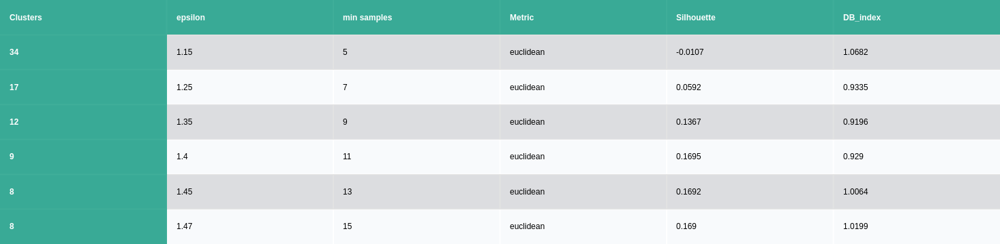

In [80]:
modelScores(dbscan_scores)

In [81]:
%%time
eps1 = 1.4 ## enter the epsilon from previously found table
mins1 = 11 ## mins that corresponds to the above epsilon
start = time.time()
dbscan = DBSCAN(n_jobs=-1, eps = eps1, min_samples = mins1,metric='euclidean')
dbscan_preds = dbscan.fit_predict(X_mat)
stop = time.time()
dbscanTime = stop - start

CPU times: user 3.51 s, sys: 597 ms, total: 4.1 s
Wall time: 728 ms


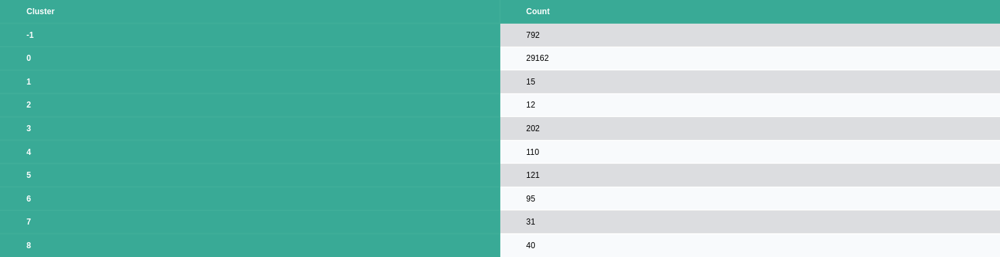

In [82]:
clusterCounts(dbscan_preds)

In [83]:
## distance
#### finding ideal values for eps and min

### number of neighbors
N_neigh = 41
dmat = pd.DataFrame()

for i in range(31,N_neigh+1,2):
    knn_graph = kneighbors_graph(X_red,i,mode='distance')
    distances = np.zeros((knn_graph.shape[0],1))
    for j in range(knn_graph.shape[0]):
        distances[j] = knn_graph[j,:].max()
    distances = np.sort(distances,axis=0)
    dmat = dmat.append(pd.DataFrame({'N':i,'x':range(X_red.shape[0]),'y':distances.reshape(30580)}))

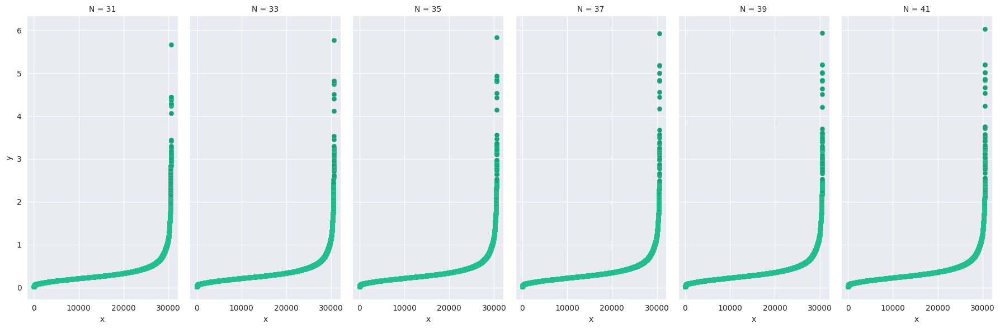

In [85]:
kwargs = {'edgecolor':'#22C795'}
sns.set_style('darkgrid')
fig_dbscan = sns.FacetGrid(dmat,col="N",height=6,aspect=.5)
fig_dbscan.map_dataframe(sns.scatterplot,x='x',y='y',color='#1B9E77',**kwargs)

In [86]:
%%time

dbscan_pca_scores = []
epsi = [.55,.60,.61,.63,.67,.68]
mins = [31,33,35,37,39,41]
metr = ['euclidean']
for i, (epsi,mins) in enumerate(zip(epsi,mins)):
    for j in metr:
        dbscan = DBSCAN(n_jobs=-1,eps=epsi,metric=j,min_samples=mins)
        labels = dbscan.fit_predict(X_red)
        dbscan_pca_scores.append({'epsilon':epsi, 
                              'min samples':mins,
                              'Metric':j,
                              'Silhouette':silhouette_score(X_red,labels),
                              'DB_index':davies_bouldin_score(X_red,labels),
                              'Clusters':len(set(dbscan.labels_))-(1 if -1 in labels else 0)})
dbscan_pca_scores = pd.DataFrame(dbscan_pca_scores)
unpatch_sklearn()

CPU times: user 2min 31s, sys: 7min 22s, total: 9min 53s
Wall time: 1min 26s


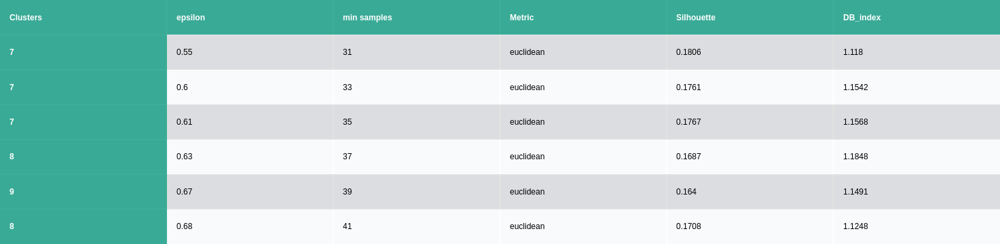

In [87]:
modelScores(dbscan_pca_scores)

In [88]:
%%time
eps2 = .55## epsilon found on table above
mins2 = 31# min sample that corresponds to the epsilon
start = time.time()
dbscan_pca = DBSCAN(n_jobs=-1, eps = eps2, min_samples = mins2,metric='manhattan')
dbscan_pca_preds = dbscan_pca.fit_predict(X_red)
stop = time.time()
dbscan_pcaTime = stop - start

CPU times: user 3.06 s, sys: 267 ms, total: 3.32 s
Wall time: 435 ms


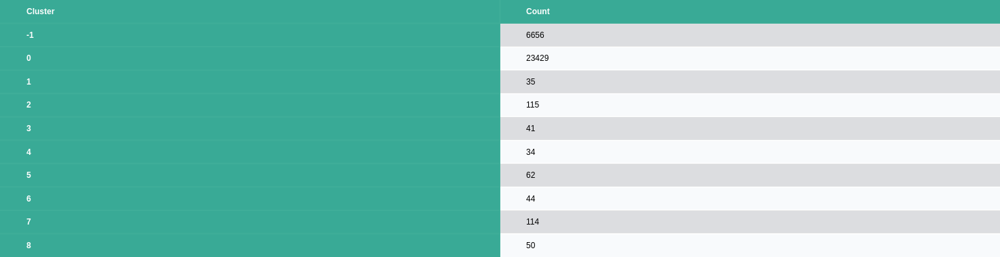

In [89]:
clusterCounts(dbscan_pca_preds)

In [90]:
scores.append({'Model':'DBSCAN',
               'Clusters':9,
               'Silhouette':silhouette_score(X_mat,dbscan_preds),
               'DB_index':davies_bouldin_score(X_mat,dbscan_preds),
               'Time':dbscanTime
              })
scores.append({'Model':'DBSCAN w PCA',
               'Clusters':7,
               'Silhouette':silhouette_score(X_red,dbscan_pca_preds),
               'DB_index':davies_bouldin_score(X_red,dbscan_pca_preds),
               'Time':dbscan_pcaTime
              })

### Modeling and Evaluation 2
(10 Points) Evaluate and Compare

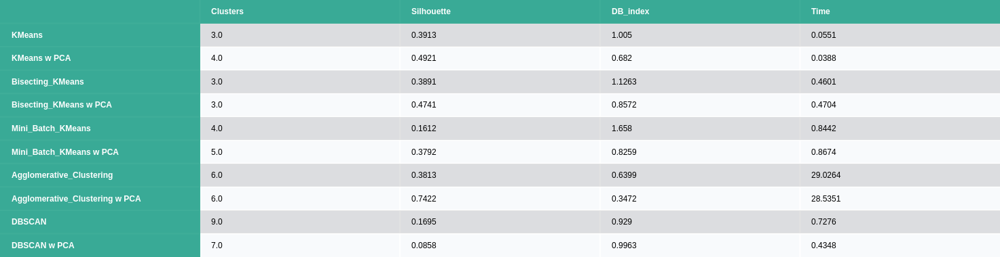

In [91]:
evalFig = ff.create_table(pd.DataFrame(scores).round(4).set_index('Model'), index=True,colorscale=[[0,'#009477'],[.5, '#d9d9d9'], [1, '#ffffff']])
evalFig.layout.width = 1100
evalFig.show()

For each algorithm, we fitted models using both all numerical variables and PCA using 4 principal components. We can then compare models' performance between original data and the reduced data, as well as between the different algorithims.

Since for this dataset, we do not know the groudn truth, or the true cluster labels, we evaluate the models using internal validation metrics. The Davies-Boulding index (DB Index), is an evaluation metric which compares the average similarity of one cluster to its most similar cluster, where a lower value means less similarity (and therefore better clustering). For this metric, the closer a value is to 0, the better we can assume the results to be. In this case, Agglomerative Clustering returned the best results for both the original data (DB score of .70) and for the reduced dataset (DB score of .347).

Silhouette score, is a metric with values ranging between -1 and 1, where -1 means values have been wrongly assigned to clusters, 0 means overlaps, and 1 means clusters are well-defined and separated. This score is based on a ratio of the mean intracluster distance versus inter cluster distance to the nearest cluster. Based on this score, Agglomerative Clustering seems to have the performed best for both the original and reduced datasets.

However, it should be noted that Agglomerative Clustering was the slowest of all the models we ran, at over 12 minutes each.

Finally, while DBSCAN produced results with low Silhouette and high DB scores, it should be noted that DBSCAN calculates clusters based on density, and can assign observations to a -1 cluster, meaning it does not belong to a cluster but is rather noise. This results in worse validation scores since these clusters labeled -1 will have large inter cluster distances and can potentially have shorter distances to nearest clusters.

### Modeling and Evaluation 3
(10 Points) Visualize Results

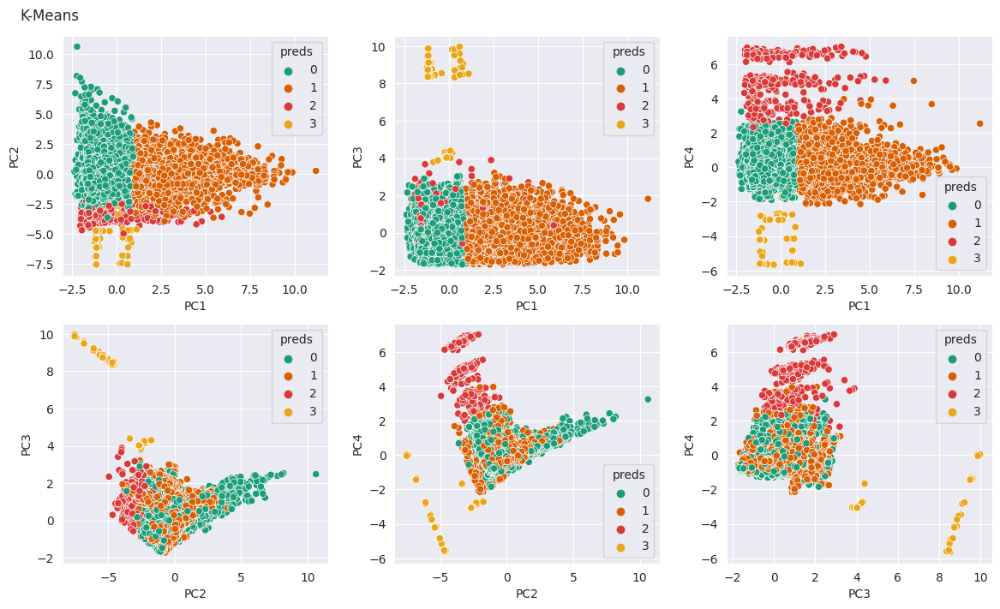

In [92]:
pca_plots(kmeans_pca_preds,'K-Means')

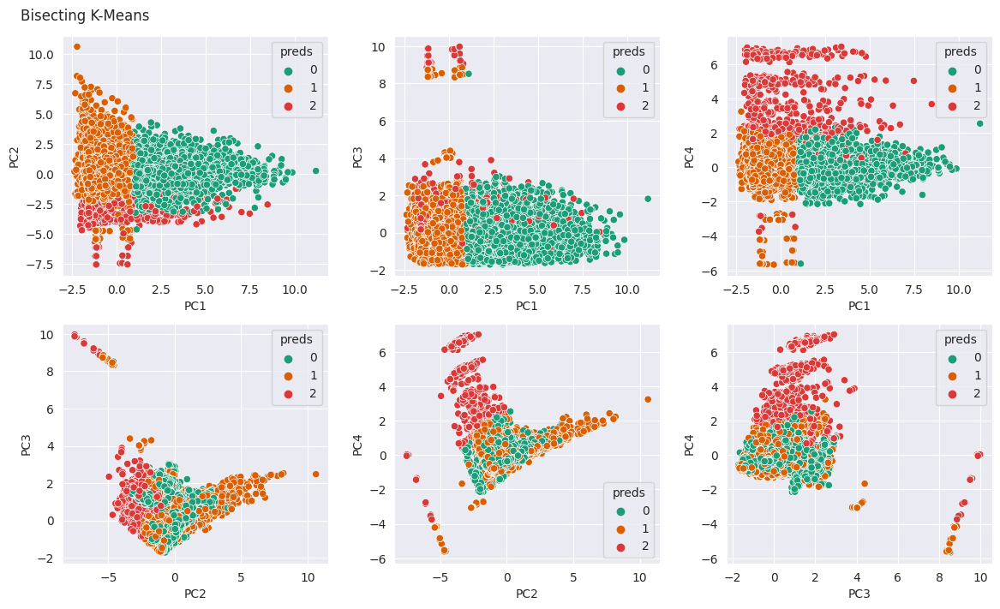

In [93]:
pca_plots(bisect_pca_preds,'Bisecting K-Means')

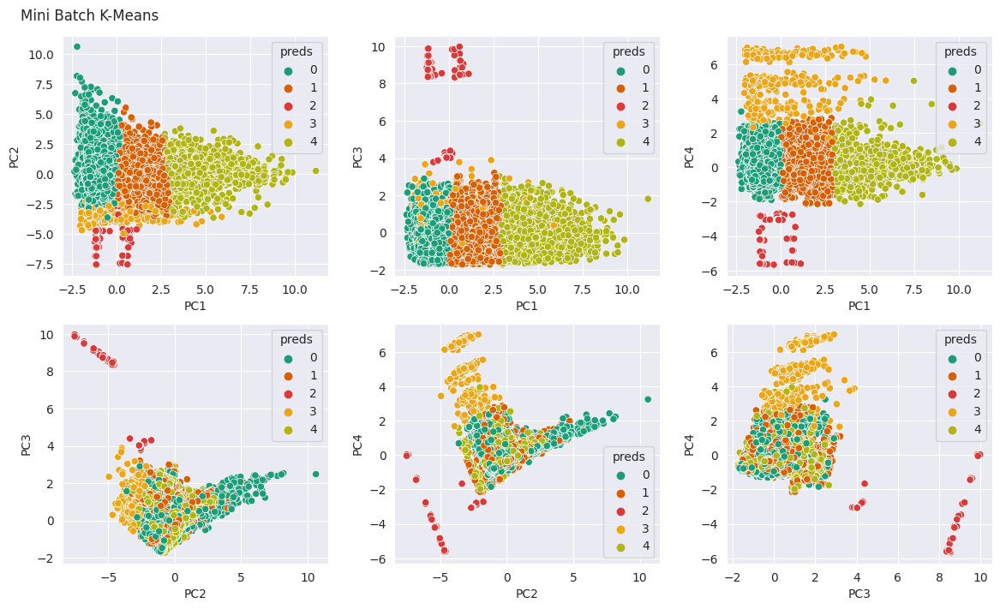

In [94]:
pca_plots(mbatch_pca_preds,'Mini Batch K-Means')

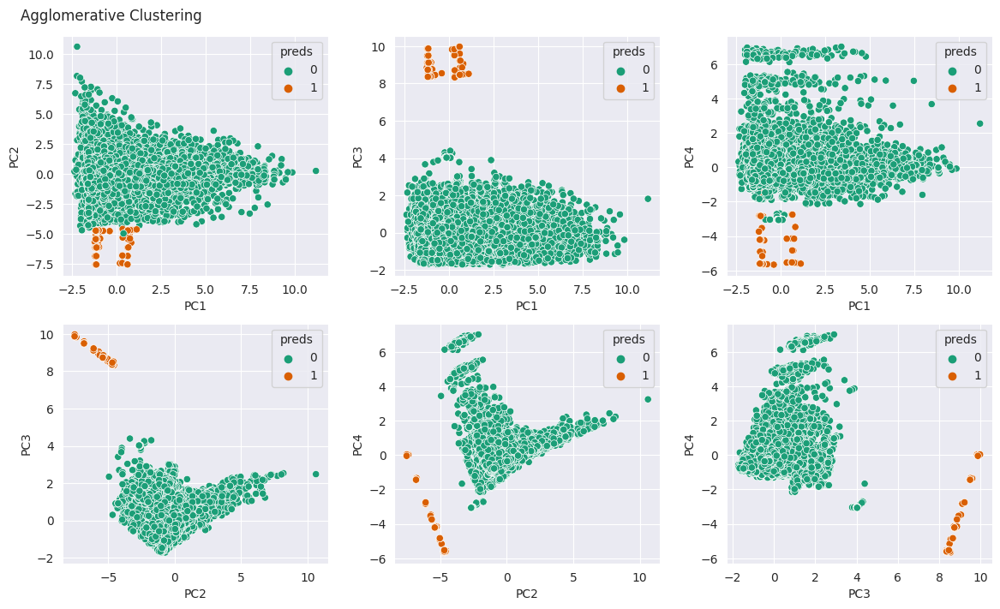

In [95]:
pca_plots(agglo_pca_preds,'Agglomerative Clustering')

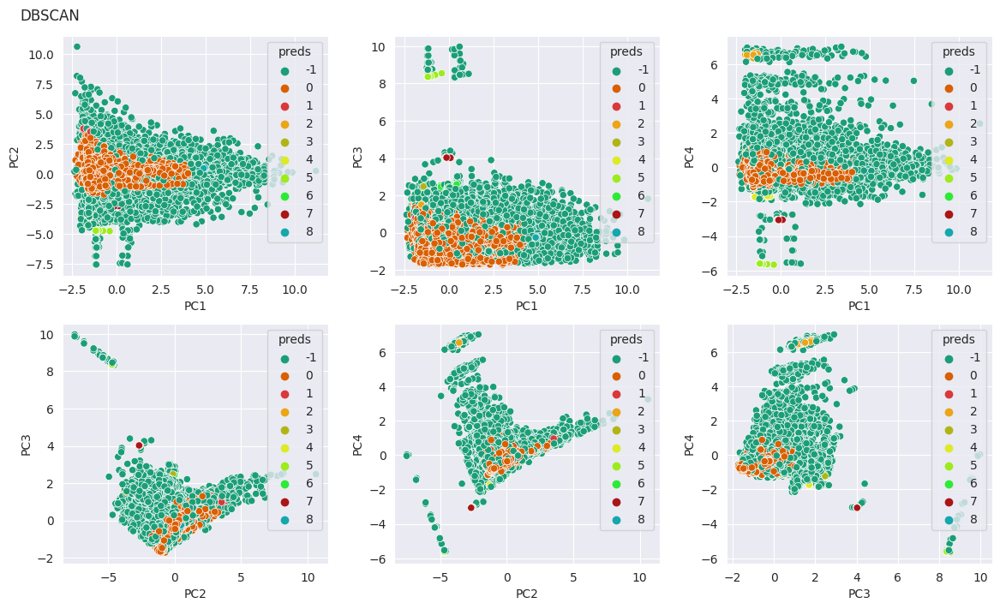

In [96]:
pca_plots(dbscan_pca_preds,'DBSCAN')

### Modeling and Evaluation 4
(20 Points) Summarize the rammifications

### Deployment
(10 Points)
Be critical of your performance and tell the reader how you current model might be usable by other parties. Did you achieve your goals? If not, can you reign in the utility of your modeling? How useful is your model for interested parties (i.e., the companies or organizations that might want to use it)? How would your deploy your model for interested parties? What other data should be collected? How often would the model need to be updated, etc.?

### Exceptional Work
(10 Points) You have free reign to provide additional analyses or combine analyses